# Datos faltantes

# Importaciones y utilidades

In [12]:
# importaciones
import pandas as pd
import numpy as np
from dateutil import rrule
from datetime import datetime, timedelta
import datetime as dt
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point, Polygon
import pylab as pl
import matplotlib.pyplot as plt
import calmap
import seaborn as sns
from bokeh.plotting import figure, save
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool
from IPython.core.interactiveshell import InteractiveShell
from IPython.core.display import HTML
from sklearn.cluster import KMeans
from matplotlib import pyplot
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from numpy.random import seed
from numpy.random import randn
from numpy import mean
from numpy import std
from numpy.random import seed
from numpy.random import randn
from scipy.stats import shapiro
from numpy.random import seed
from numpy.random import randn
from numpy import percentile
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 
from statsmodels.graphics.tsaplots import plot_acf
from fiona.crs import from_epsg


output_notebook()

Loading BokehJS ...

In [3]:
#utilidades
def plot_series(time, series, format="-", start=0, end=None):
    plt.plot(time[start:end], series[start:end], format)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(False)
    
def getPointCoords(row, geom, coord_type):
    """Calculates coordinates ('x' or 'y') of a Point geometry"""
    if coord_type == 'x':
        return row[geom].x
    elif coord_type == 'y':
        return row[geom].y

    
def getLineCoords(row, geom, coord_type):
    """Returns a list of coordinates ('x' or 'y') of a LineString geometry"""
    if coord_type == 'x':
        return list( row[geom].coords.xy[0] )
    elif coord_type == 'y':
        return list( row[geom].coords.xy[1] )



# Datasets

In [1]:
base_path_dataset='datasets'

Se toma como entrada el resultado del paso anterior

In [32]:
conteo =pd.read_pickle(f'{base_path_dataset}/status/iu-montevideo-conteo-sinanomalias.pkl')
sensores =pd.read_pickle(f'{base_path_dataset}/status/iu-montevideo-sensores-sinanomalias.pkl')

# Datos faltantes

A continuación vamos a inspeccionar los valores perdidos y para eso, primero veamos las columnas que tienen valores perdidos y veamos qué porcentaje de los datos falta. Para hacer eso, usamos una función que calcule el porcentaje de valores perdidos para poder usar la misma función varias veces en todo el dataframe.

In [33]:
# funcion que calcula el porcentaje de valores perdidos
def calc_percent_NAs(df):
    nans = pd.DataFrame(df.isnull().sum().sort_values(ascending=False)/len(df), columns=['percent']) 
    idx = nans['percent'] > 0
    return nans[idx]
# ahora observamos las columnas con valores perdidos de maximo a menor
porcentajePerdidos = calc_percent_NAs(conteo)
display(HTML(porcentajePerdidos.to_html()))

,percent
245,0.997213
244,0.997213
288,0.976750
326,0.952207
298,0.918170
295,0.918170
190,0.918170
297,0.918151
174,0.918122
296,0.918113


Mirando la tabla he decidido eliminar todos los sensores con más del 8% de los datos perdidos. Ya que deja con conjunto de sensores bastante grande con los que trabajar con muy pocos datos faltantes 

In [34]:
# buscamos los sensores a eliminar
toDeletete =  porcentajePerdidos.loc[(porcentajePerdidos['percent'] > 0.08)].index.tolist()

# lo eliminamos de los datos de conteo
conteo = conteo.drop(toDeletete, axis = 1) 

#lo eliminamos de los datos de ubicacion de sensores
sensores = sensores.drop(sensores.index[toDeletete])

Ahora consultremos si faltan días enteros de datos faltantes.

In [35]:
data_mean = conteo.resample('D').mean()
print('Datos perdidos por dia?')
print(data_mean.isna().sum())

Datos perdidos por dia?
7      23
8      23
9      23
10     10
11     10
       ..
323     0
327     0
330     0
331     0
332     0
Length: 162, dtype: int64


Hay días enteros en los que no se registraron datos en estos estos casos los podríamos commpletar por el valor del día anterior o día promedio, esta  solución para series de tiempo es mejor  que simplemente eliminar la fila (es mejor tener la misma separación temporal entre todas las filas) o simplemente usar el valor medio (ya que esto alteraría la forma de la curva).

También se podría utilizar otra técnica más complejo cómo completar los valores con utilizando redes GAN, pero a efectos de este trabajo eliminaremos del dataset los sensores con más de 1 día entero de datos perdidos y el resto lo completo con una interpolacion

In [36]:
#por ahora elimino los sensores que tienen m'as de un dia entero de datos perdidos
for index, value in conteo.resample('D').mean().isna().sum().items():    
    if (value>1):
        del conteo[index]

# se completan los campos vacios haciendo una interpolaci'on linel
names=conteo.columns[conteo.isna().any()].tolist()
for name in names:
     conteo[name] = conteo[name].interpolate()



In [37]:
conteo.to_pickle(f'{base_path_dataset}/status/iu-montevideo-conteo-completo.pkl', protocol=4)
sensores.to_pickle(f'{base_path_dataset}/status/iu-montevideo-sensores-completo.pkl', protocol=4)

# Generating synthetic financial time series with WGANs

# Los datos

In [38]:
conteo =pd.read_pickle(f'{base_path_dataset}/status/iu-montevideo-conteo-completo.pkl')
sensores =pd.read_pickle(f'{base_path_dataset}/status/iu-montevideo-sensores-completo.pkl')

Ahora que limpiamos los datos, tenemos información de los sensores

In [39]:
sensores.head()

,latitud,longitud,dsc_avenida,dsc_int_anterior,dsc_int_siguiente,id_carril
SensorId,,,,,,
7,-34.916586,-56.168989,Rambla,Errazquin,Sarmiento,1
8,-34.916586,-56.168989,Rambla,Errazquin,Sarmiento,2
9,-34.916586,-56.168989,Rambla,Errazquin,Sarmiento,3
10,-34.916417,-56.148942,Rambla,Montero,Bv Espana,1
11,-34.916417,-56.148942,Rambla,Montero,Bv Espana,2


Que los vamos a visualizar en un mapa

In [40]:
# primero cargamos información de las vias 
filePath = f'{base_path_dataset}/montevideo/shapes/v_mdg_vias/v_mdg_vias.shp'
geoVias = GeoDataFrame.from_file(filePath)
geoVias = geoVias.to_crs(epsg=4326)


# convertimos la ubicación de los sensores a geopandas
geomertrySensores2 = [Point(xy) for xy in zip(sensores['longitud'], sensores['latitud'])]
crs = from_epsg(4326) 
geoSensores = gpd.GeoDataFrame(sensores,crs=crs, geometry = geomertrySensores2)


#se pinta usando matplot
# f, ax = pl.subplots(figsize=(60,45))

# geoVias.plot(color = 'grey', alpha=0.4, ax = ax)
# geoSensores.plot(ax=ax, markersize=20, color="blue", marker="o", column='id')

# for  index, row in geoSensores.iterrows():
#         x = row.geometry.centroid.x
#         y = row.geometry.centroid.y
#         pl.text(x, y, row.id, fontsize=10)


p = figure(title="Ubicacion de sensores",
           plot_height = 650 ,
           plot_width = 900, )

    
geoSensores['x'] = geoSensores.apply(getPointCoords, geom='geometry', coord_type='x', axis=1)
geoSensores['y'] = geoSensores.apply(getPointCoords, geom='geometry', coord_type='y', axis=1)
p_df = geoSensores.drop('geometry', axis=1).copy()   
psource = ColumnDataSource(p_df)   
p.circle('x', 'y', source=psource, color='blue', size=8, name="sensores")

my_hover = HoverTool(names=["sensores"])
my_hover.tooltips = [('Sensor id', '@SensorId')]
p.add_tools(my_hover)
    
geoVias['x'] = geoVias.apply(getLineCoords, geom='geometry', coord_type='x', axis=1)
geoVias['y'] = geoVias.apply(getLineCoords, geom='geometry', coord_type='y', axis=1)
m_df = geoVias.drop('geometry', axis=1).copy()
msource = ColumnDataSource(m_df)
p.multi_line('x', 'y', source=msource, color='grey', alpha=0.4, line_width=1)

show(p)




https://imgur.com/a/QRx30ac

Y por otro lado tenemos los datos de conteo

In [41]:
conteo.head()

,24,25,30,31,34,35,40,41,42,43,...,313,315,316,317,322,323,327,330,331,332
2018-01-01 00:00:00,0.0,1.0,0.0,1.0,4.0,3.0,7.0,9.0,0.0,1.0,...,5.0,1.0,3.0,0.0,1.0,0.0,1.0,4.0,0.0,1.0
2018-01-01 00:05:00,0.0,1.0,1.0,1.0,3.0,2.0,2.0,4.0,0.0,0.0,...,4.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2018-01-01 00:10:00,1.0,2.0,1.0,0.0,2.0,2.0,3.0,7.0,0.0,0.0,...,2.0,0.0,3.0,4.0,2.0,0.0,3.0,3.0,0.0,1.0
2018-01-01 00:15:00,1.0,2.0,2.0,0.0,0.0,0.0,8.0,9.0,0.0,0.0,...,0.0,1.0,10.0,5.0,2.0,0.0,3.0,4.0,0.0,2.0
2018-01-01 00:20:00,2.0,0.0,4.0,2.0,2.0,2.0,10.0,19.0,0.0,2.0,...,6.0,1.0,7.0,3.0,0.0,0.0,4.0,6.0,0.0,3.0


In [42]:
conteo.describe()

,24,25,30,31,34,35,40,41,42,43,...,313,315,316,317,322,323,327,330,331,332
count,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,...,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000,105120.000000
mean,18.567461,17.730927,21.486577,24.550771,35.816272,19.867799,52.881069,42.187861,19.711715,27.813185,...,29.584223,13.962595,22.296937,17.965240,17.393060,4.433210,19.727792,21.819021,15.630403,24.028035
std,13.233936,12.373242,16.969876,15.749912,25.402522,14.098074,37.657839,27.177993,14.137854,17.200786,...,16.325365,10.519247,13.529268,10.294755,12.204466,3.792598,11.958137,12.066249,14.422744,16.889804
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,6.000000,5.000000,10.000000,13.000000,7.000000,14.000000,18.000000,6.000000,11.000000,...,15.000000,4.000000,10.000000,10.000000,6.000000,1.000000,9.000000,12.000000,2.000000,8.000000
50%,19.000000,18.000000,19.000000,25.000000,33.000000,18.000000,54.000000,43.000000,20.000000,29.000000,...,31.000000,13.000000,23.000000,18.000000,17.000000,4.000000,21.000000,23.000000,12.000000,23.000000
75%,29.000000,27.000000,36.000000,37.000000,54.000000,30.000000,87.000000,62.000000,32.000000,43.000000,...,42.000000,22.000000,33.000000,25.000000,27.000000,7.000000,29.000000,31.000000,27.000000,39.000000
max,85.000000,75.000000,106.000000,80.000000,133.000000,61.000000,150.000000,125.000000,66.000000,79.000000,...,89.000000,59.000000,71.000000,58.000000,62.000000,28.000000,71.000000,53.000000,73.000000,80.000000


Exploramos el gráfico de conteo para todos los sensores

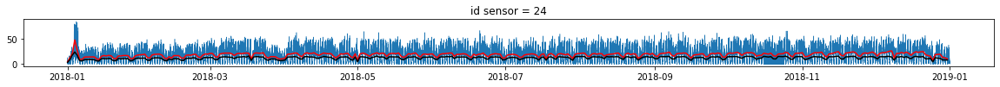

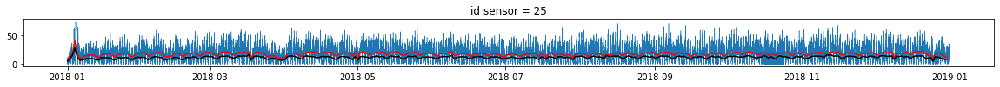

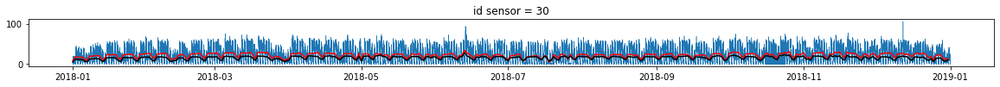

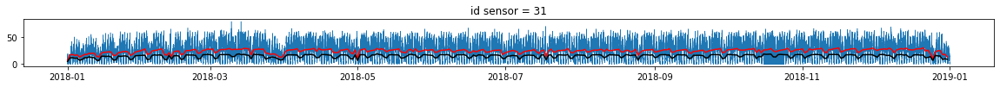

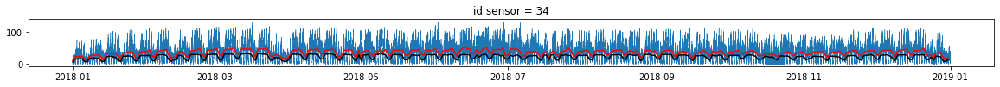

...

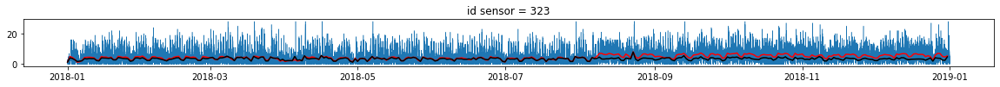

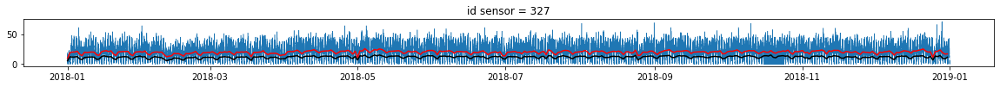

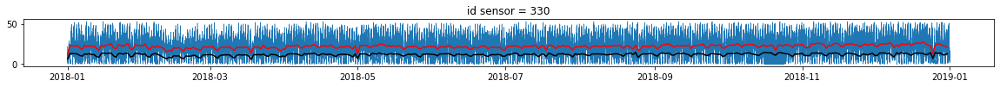

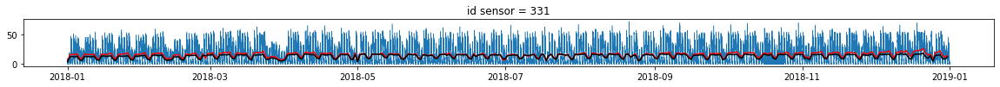

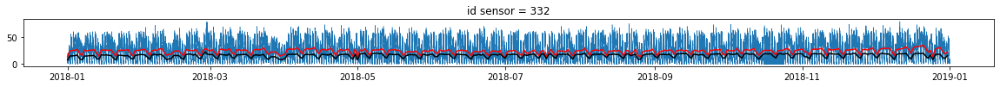

In [43]:
# Resample the entire dataset by daily average
names=conteo.columns
rollmean = conteo.resample(rule='D').mean()
rollstd = conteo.resample(rule='D').std()
# Plot time series for each sensor with its mean and standard deviation
for name in names:
    _ = plt.figure(figsize=(20, 1))
    _ = plt.plot(conteo[name],  label='Original', linewidth=0.5)
    _ = plt.plot(rollmean[name], color='red', label='Media móvil')
    _ = plt.plot(rollstd[name], color='black', label='Desviación estándar móvil')
    _ = plt.title('id sensor = ' + str(name))
    plt.show()



# names=conteo.columns
# for name in names:
#     _ = plt.figure(figsize=(20,1))
#     _ = plt.plot(conteo[name], linewidth=0.5)
#     _ = plt.title('sensor Id = ' + str(name))
#     plt.show()

Todas las series de tiempo muestran claramente una periodicidad, en la que un patrón se repite una y otra vez a intervalos de tiempo regulares.